In [89]:
using LinearAlgebra
#using MKL
using DelimitedFiles
using Plots;gr()
using LaTeXStrings

#Plots.default(show = true)
#pyplot()

include("generate_matrices_dislocation2D.jl")
include("angmom.jl")

generate_spin_matrices (generic function with 1 method)

In [90]:
function Energyspectra(Lx::Int64, Ly::Int64, l1::Int64, l2::Int64, m_lattice::Int64, npts::Int64)
    #close("all")
    #t0=time()
    Jx, Jy, Jz = generate_spin_matrices(1/2)
    sigma_x = 2*Jx;
    sigma_y = 2*Jy;
    sigma_z = 2*Jz;
    const_2D, CX2Dp, SX2Dp, CY2Dp, SY2Dp = generate_matrices_double_dislocation2D(Lx, Ly, l1,l2,m_lattice,1, 1)
    const_2D, CX2Dnp, SX2Dnp, CY2Dnp, SY2Dnp = generate_matrices_double_dislocation2D(Lx, Ly, l1,l2,m_lattice,0, 0)


    nStates = 2*(Lx*Ly + l2)
    h_ci_np = zeros(ComplexF64,nStates,nStates)
    t0 = 1.0
    t1 = 1.0

    m_array = range(-4,4
    ,npts)

    energies_np_array = zeros(npts*nStates)
    energies_p_array = zeros(npts*nStates)

    for ii = 1:npts
        h_ci_np = t1*(kron(SX2Dnp, sigma_x) + kron(SY2Dnp, sigma_y)) - t0 * kron(m_array[ii]*const_2D - CX2Dnp - CY2Dnp, sigma_z)
        h_ci_p = t1*(kron(SX2Dp, sigma_x) + kron(SY2Dp, sigma_y)) - t0 * kron(m_array[ii]*const_2D - CX2Dp - CY2Dp, sigma_z)

        energy_eigenvalues_np = eigvals(h_ci_np);
        energy_eigenvalues_p = eigvals(h_ci_p);
        for r=1:nStates
            energies_np_array[(ii-1)*(nStates) + r] = energy_eigenvalues_np[r];
            energies_p_array[(ii-1)*(nStates) + r] = energy_eigenvalues_p[r];
        end
    end
    xvar = kron(m_array, range(1,1,nStates))

    #t1 = time()
    #println("time taken = ", t1 - t0, "seconds")
    plt1 = scatter(xvar, energies_np_array, legend = false, xtickfontsize = 20, ytickfontsize = 20, legendfontsize = 20, markersize=1.0, xlabel=L"m", ylabel=L"E", framestyle = :box, linewidth=5, reuse=false, title="Allowed energies for OBC", titlefontsize=20)
    plt2 = scatter(xvar, energies_p_array, legend = false, xtickfontsize = 20, ytickfontsize = 20, legendfontsize = 20, markersize=1.0, xlabel=L"m", ylabel=L"E", framestyle = :box, linewidth=5, reuse=false, title="Allowed energies for PBC", titlefontsize=20)
    display(plt1)
    display(plt2)
end

Energyspectra (generic function with 1 method)

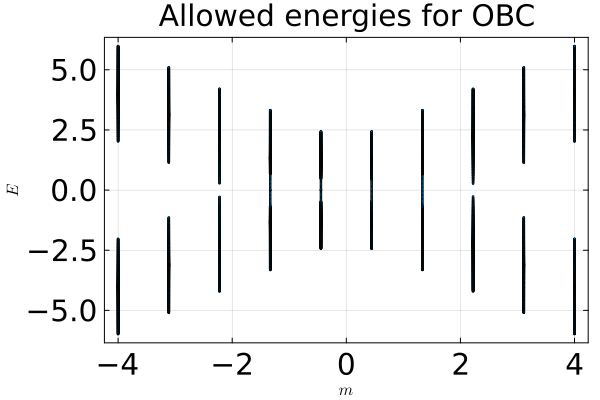

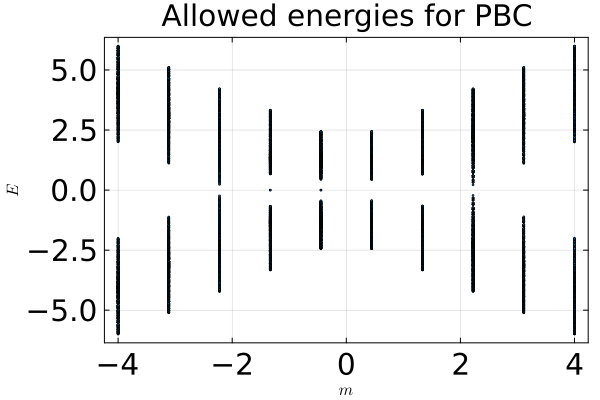

Verified: Building Block Matrices are Hermitian
Verified: Building Block Matrices are Hermitian
 26.486156 seconds (1.18 M allocations: 6.502 GiB, 5.02% gc time)


In [91]:
@time Energyspectra(28,28,7,14,14,10)

EnergyEigenvaluesForFixedm (generic function with 1 method)

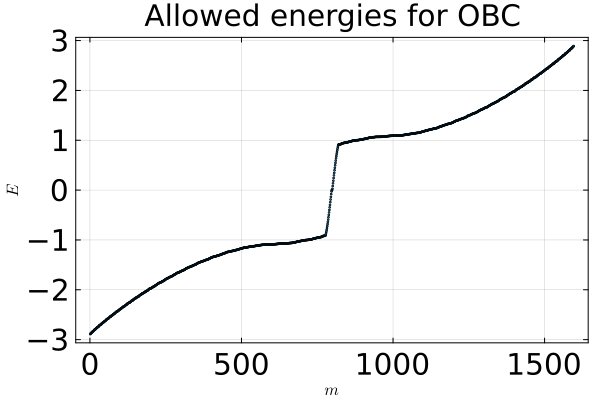

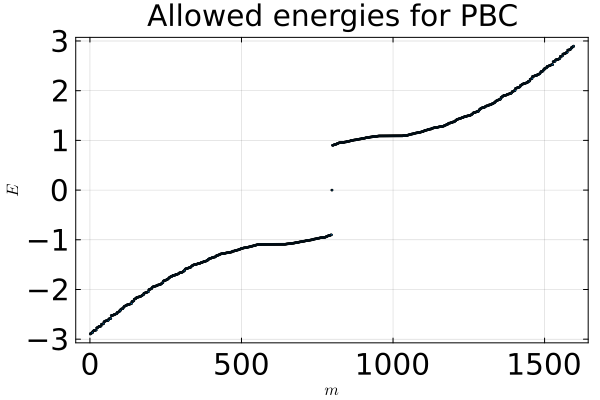

Verified: Building Block Matrices are Hermitian
Verified: Building Block Matrices are Hermitian


In [94]:
function show_lattice(Lx,Ly,l1,l2,m)
	n_atoms = Lx * Ly + l2;

	density = ones(Lx+1,Ly)
	# for a = 1:m
	# 	for b = 1:l1
	# 		density[a,b] = 1;
	# 	end
	# end
	for b = 1:l1
		density[m+1,b] = 0;
	end
	# for a = (m+1):Lx
	# 	for b = 1:l1
	# 		density[a+1,b] = 1;
	# 	end
	# end
	# for a = 1:(Lx+1)
	# 	for b = (l1 + 1):(l1 + l2)
	# 		density[a,b] = 1;
	# 	end
	# end

	# for a = 1:m
	# 	for b = (l1 + l2 + 1):Ly
	# 		density[a,b] = 1;
	# 	end
	# end

	for b = (l1 + l2 + 1):Ly
		density[m+1,b] = 0;
	end
	# for a = (m+1):Lx
	# 	for b = (l1 + l2 + 1):Ly
	# 		density[a+1,b] = 1;
	# 	end
	# end

	xx = range(1, stop=Lx+1, length=Lx+1)
	yy = range(1, stop=Ly, length=Ly)

	xx = repeat(xx, 1, Ly)'
	yy = repeat(yy, 1, Lx+1)

	point_size = 3 * vec(density')

	scatter(vec(xx),vec(yy),marker_z = vec(density'), color=:viridis, ms = point_size, legend=false, xlabel="X", ylabel="Y", title="Scatter plot of Lattice")
end

show_lattice (generic function with 1 method)

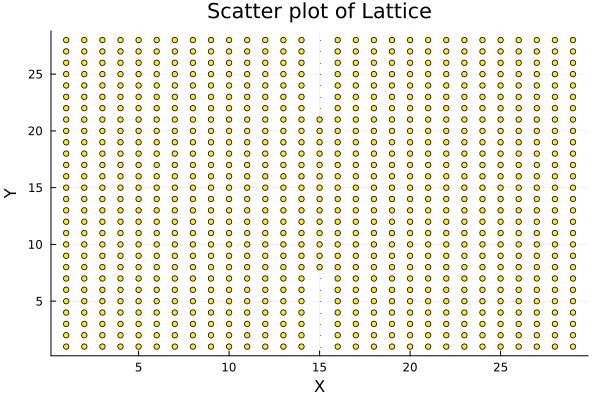

In [95]:
show_lattice(28,28,7,14,14)

In [127]:
function plotState(local_density, Lx, Ly, l1, l2, m)
	
	density = zeros(Lx+1,Ly)

	#lower left
	for a = 1:m
		for b = 1:l1
			density[a,b] = local_density[a + (b-1)*Lx];
		end
	end
	#lower gap
	for b = 1:l1
		density[m+1,b] = 0;
	end
	#lower right
	for a = (m+1):Lx
		for b = 1:l1
			density[a+1,b] = local_density[a + (b-1)*Lx];
		end
	end
	#middle part
	for a = 1:(Lx+1)
		for b = (l1 + 1):(l1 + l2)
			density[a,b] = local_density[l1 * Lx + a + (b-l1-1)*(Lx + 1)];
		end
	end
	#upper left
	for a = 1:m
		for b = (l1 + l2 + 1):Ly
			density[a,b] = local_density[l1 * Lx + l2 * (Lx + 1) + a + (b-l1-l2-1)*Lx];
		end
	end
	#upper gap
	for b = (l1 + l2 + 1):Ly
		density[m+1,b] = 0;
	end
	#upper right
	for a = (m+1):Lx
		for b = (l1 + l2 + 1):Ly
			density[a+1,b] = local_density[l1 * Lx + l2 * (Lx + 1) + a + (b-l1-l2-1)*Lx];
		end
	end

	
	xx = range(1, stop=Lx+1, length=Lx+1)
	yy = range(1, stop=Ly, length=Ly)

	xx = repeat(xx, 1, Ly)'
	yy = repeat(yy, 1, Lx+1)

	point_size = 3 * vec(density')/maximum(vec(density'))

	plt = scatter(vec(xx),vec(yy),marker_z = vec(density'), color=:viridis, ms = point_size, legend=true, xlabel="X", ylabel="Y", title="Joint LDoS of two states closest to zero")
	display(plt)
end

plotState (generic function with 1 method)

In [128]:
function EnergyEigenvaluesForFixedm(Lx::Int64, Ly::Int64, l1::Int64, l2::Int64, m_lattice::Int64, m_Hamil::Float64)
    #close("all")
    #t0=time()
    Jx, Jy, Jz = generate_spin_matrices(1/2)
    sigma_x = 2*Jx;
    sigma_y = 2*Jy;
    sigma_z = 2*Jz;
    const_2D, CX2Dp, SX2Dp, CY2Dp, SY2Dp = generate_matrices_double_dislocation2D(Lx, Ly, l1,l2,m_lattice,1, 1)
    const_2D, CX2Dnp, SX2Dnp, CY2Dnp, SY2Dnp = generate_matrices_double_dislocation2D(Lx, Ly, l1,l2,m_lattice,0, 0)

    nAtoms = (Lx*Ly + l2)
    nStates = 2*nAtoms

    t0 = 1.0
    t1 = 1.0

    energies_np_array = zeros(nStates)
    energies_p_array = zeros(nStates)

        h_ci_np = t1*(kron(SX2Dnp, sigma_x) + kron(SY2Dnp, sigma_y)) - t0 * kron(m_Hamil*const_2D - CX2Dnp - CY2Dnp, sigma_z)
        h_ci_p = t1*(kron(SX2Dp, sigma_x) + kron(SY2Dp, sigma_y)) - t0 * kron(m_Hamil*const_2D - CX2Dp - CY2Dp, sigma_z)

        eig_np = eigen(h_ci_np);
        eig_p = eigen(h_ci_p);

        energy_eigenvalues_np = eig_np.values;
        energy_eigenvalues_p = eig_p.values;
        
        for r=1:nStates
            energies_np_array[r] = energy_eigenvalues_np[r];
            energies_p_array[r] = energy_eigenvalues_p[r];
        end

    interesting_local_density_p = zeros(nAtoms);
    for ii = 1: nAtoms
        interesting_local_density_p[ii] = abs(eig_p.vectors[2*ii-1, nAtoms])^2 + abs(eig_p.vectors[2*ii, nAtoms])^2 + abs(eig_p.vectors[2*ii-1, nAtoms+1] )^2+ abs(eig_p.vectors[2*ii, nAtoms+1])^2
    end
    #t1 = time()
    #println("time taken = ", t1 - t0, "seconds")
    plt1 = scatter(1:nStates, energies_np_array, legend = false, xtickfontsize = 20, ytickfontsize = 20, legendfontsize = 20, markersize=1.0, xlabel=L"m", ylabel=L"E", framestyle = :box, linewidth=5, reuse=false, title="Allowed energies for OBC", titlefontsize=20)
    plt2 = scatter(1:nStates, energies_p_array, legend = false, xtickfontsize = 20, ytickfontsize = 20, legendfontsize = 20, markersize=1.0, xlabel=L"m", ylabel=L"E", framestyle = :box, linewidth=5, reuse=false, title="Allowed energies for PBC", titlefontsize=20)
    display(plt1)
    display(plt2)
    plotState(interesting_local_density_p,Lx,Ly,l1,l2,m_lattice)
end

EnergyEigenvaluesForFixedm (generic function with 1 method)

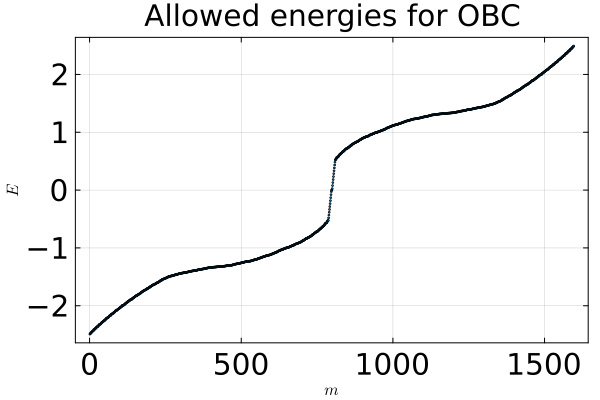

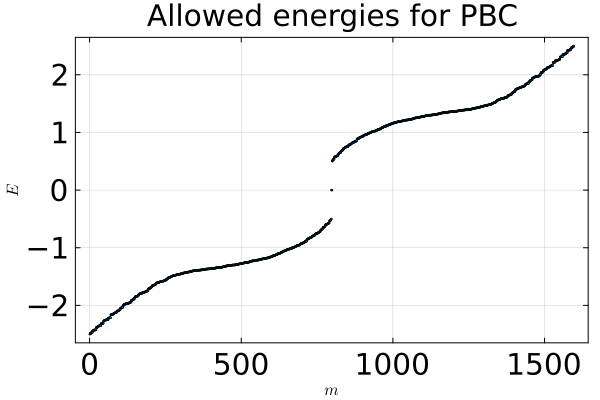

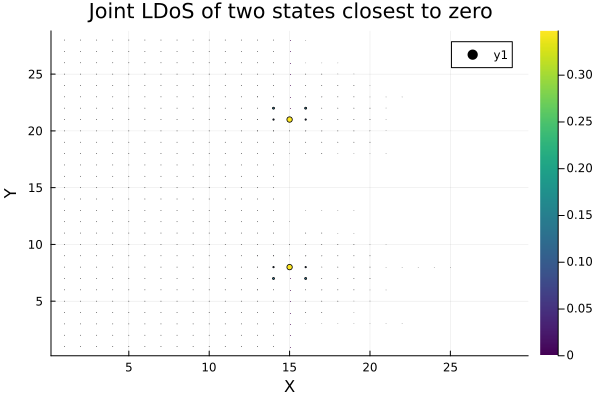

Verified: Building Block Matrices are Hermitian
Verified: Building Block Matrices are Hermitian


In [130]:
EnergyEigenvaluesForFixedm(28,28,7,14,14,-0.5)